In [1]:
import numpy as np 
import matplotlib.pyplot as plt 
import tensorflow as tf 
from tensorflow import keras
from keras.models import Model
from keras.layers import Conv2D, MaxPooling2D, Dense, Input, Conv2D, UpSampling2D, BatchNormalization
from tensorflow.keras.optimizers import Adam
from keras.callbacks import EarlyStopping
import cv2
import os 
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
import random

In [2]:
os.listdir()

['.ipynb_checkpoints',
 'dataset',
 'dataset.zip',
 'dataset2',
 'dataset2.zip',
 'IO',
 'logs',
 'remover.py',
 'saved_models',
 'test_model',
 'Untitled.ipynb',
 'Untitled2.ipynb',
 'WM_Remove_GAN.ipynb']

In [3]:
train_path = "./dataset2/train/"
test_path = "./dataset2/test/"

In [4]:
# Get the filenames for each file in folder
def getFileNames(folder):
    filename = np.array(folder.split('/'))[-1]
    return filename

In [5]:
# Match watermarked and non-watermarked images
def matchImages(watermarkArr, normalArr, wmDir, normDir):
    sortedWatermark = np.array([])
    sortedNormal = np.array([])
    
    wArr = list(watermarkArr)
    nArr = list(normalArr)
    
    length = len(watermarkArr) if len(watermarkArr) >= len(normalArr) else len(normalArr)
    
    for pos in range(length):
        try:
            if length == len(watermarkArr):
                exist_norm = nArr.index(wArr[pos])
                sortedWatermark = np.append(sortedWatermark, wmDir + watermarkArr[pos])
                sortedNormal = np.append(sortedNormal, normDir + normalArr[exist_norm])
            elif length == len(normalArr):
                exist_wm = wArr.index(nArr[pos])
                sortedWatermark = np.append(sortedWatermark, wmDir + watermarkArr[exist_wm])
                sortedNormal = np.append(sortedNormal, normDir, normalArr[pos])
        except ValueError:
            continue
    return sortedWatermark, sortedNormal

In [6]:
# Paths for files
train_path_watermark = "./dataset2/train/watermark/"
train_path_noWM = "./dataset2/train/no-watermark/"

In [7]:
tp_watermark = np.array([])
tp_noWM = np.array([])

# Load images for watermarked
for root, dirs, files in os.walk(train_path_watermark, topdown = True):
    for file in files:
        tp_watermark = np.append(tp_watermark, getFileNames(file))

In [8]:
# Load non watermarked images
for root, dirs, files in os.walk(train_path_noWM, topdown = True):
    for file in files:
        tp_noWM = np.append(tp_noWM, getFileNames(file))

In [9]:
# Match and sort the images
watermark_sorted, normal_sorted = matchImages(tp_watermark, tp_noWM, train_path_watermark, train_path_noWM)

In [10]:
test_path_watermark = "./dataset2/test/watermark/"
test_path_noWM = "./dataset2/test/no-watermark/"

In [11]:
te_watermark = np.array([])
te_noWM = np.array([])

In [12]:
for root, dirs, files in os.walk(test_path_watermark, topdown = True):
    for file in files:
        te_watermark = np.append(te_watermark, getFileNames(file))

In [13]:
for root, dirs, files in os.walk(test_path_noWM, topdown = True):
    for file in files:
        te_noWM = np.append(te_noWM, getFileNames(file))

In [14]:
test_wm_sorted, test_noWM_sorted = matchImages(te_watermark, te_noWM, test_path_watermark, test_path_noWM)

In [15]:
# Resize dimensions here
width = 300
height = 300
dim = (width, height)

In [16]:
# Create array of pixels from files
def createPixelArr(files):
    data = []
    for image in files:
        try:
            img_arr = cv2.imread(image, cv2.IMREAD_COLOR)
            resized_arr = cv2.resize(img_arr, (width, height))
            data.append(resized_arr)
        except Exception as e:
            print(e)
    return np.array(data)

In [17]:
# Training pixel arrays
train_wm_pixels = createPixelArr(watermark_sorted)
train_noWM_pixels = createPixelArr(normal_sorted)

In [18]:
# Split to train and test sets
X_train, X_test, y_train, y_test = train_test_split(train_wm_pixels, train_noWM_pixels, train_size = 0.8, random_state = 1)

In [19]:
# Garbage Collect
import gc
del train_wm_pixels
del train_noWM_pixels
gc.collect()

60

In [ ]:
# Augment images with random modifications
# Gives us more data to work with
def data_augmentation(inputImage): 
    return randomContrast(randomBrightness(inputImage)).numpy()

def randomFlip(pic): 
    return tf.image.random_flip_up_down(tf.image.random_flip_left_right(pic, 1), 1)

def randomBrightness(pic):
    return tf.image.random_brightness(pic, random.uniform(0.01, 0.2), 1)

def randomContrast(pic):
    return tf.image.random_contrast(pic, 0.2, 0.7, 1)

In [ ]:
# Apply augmentations
data_augmented_X = []
data_augmented_y = []
for image in X_train:
    data_augmented_X.append(data_augmentation(image))

for image in y_train:
    data_augmented_y.append(data_augmentation(image))

In [ ]:
# Add aug images to the train arrays
X_train = np.append(X_train, data_augmented_X, axis=0)
y_train = np.append(y_train, data_augmented_y, axis=0)

del data_augmented_X
del data_augmented_y
gc.collect()

In [20]:
# Normalize pixel values between 0 and 1
X_train = X_train / 255
y_train = y_train / 255
X_test = X_test / 255
y_test = y_test / 255

In [21]:
gc.collect()

40

In [22]:
# Generate encoder/decoder model
def create_model(img_x, img_y):
    x = Input(shape=(img_x, img_y, 3))
    
    # Think this process as function composition in algebra 
    
    # Encoder - compresses the input into a latent representation
    e_conv1 = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    pool1 = MaxPooling2D((2, 2), padding='same')(e_conv1)
    batchnorm_1 = BatchNormalization()(pool1)
    
    e_conv2 = Conv2D(32, (3, 3), activation='relu', padding='same')(batchnorm_1)
    pool2 = MaxPooling2D((2, 2), padding='same')(e_conv2)
    batchnorm_2 = BatchNormalization()(pool2)
    
    e_conv3 = Conv2D(16, (3, 3), activation='relu', padding='same')(batchnorm_2)
    h = MaxPooling2D((2, 2), padding='same')(e_conv3)
    
    # Decoder - reconstructs the input from a latent representation 
    d_conv1 = Conv2D(64, (3, 3), activation='relu', padding='same')(h)
    up1 = UpSampling2D((2, 2))(d_conv1)
    
    d_conv2 = Conv2D(32, (3, 3), activation='relu', padding='same')(up1)
    up2 = UpSampling2D((2, 2))(d_conv2)
    
    d_conv3 = Conv2D(16, (3, 3), activation='relu')(up2)
    up3 = UpSampling2D((2, 2))(d_conv3)
    
    r = Conv2D(3, (3, 3), activation='sigmoid', padding='same')(up3)
    
    model = Model(x, r)
    model.compile(optimizer=Adam(learning_rate=0.0005), loss='mse')
    return model

In [23]:
%load_ext tensorboard
import datetime

In [24]:
# Tensorboard stuff
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
watermark_auto_encoder = create_model(width, height)
early_stop = EarlyStopping(monitor='loss', patience=5, restore_best_weights=True)
tensorboard_cb = tf.keras.callbacks.TensorBoard(log_dir = "./logs", histogram_freq = 1)

In [26]:
# Train model
gc.collect()
watermark_auto_encoder.fit(X_train, y_train, batch_size=25, epochs=100, callbacks=[early_stop, tensorboard_cb])

Epoch 1/100
65/65 [==============================] - 10s 104ms/step - loss: 0.0200
Epoch 2/100
65/65 [==============================] - 6s 98ms/step - loss: 0.0119
Epoch 3/100
65/65 [==============================] - 6s 99ms/step - loss: 0.0104
Epoch 4/100
65/65 [==============================] - 6s 98ms/step - loss: 0.0100
Epoch 5/100
65/65 [==============================] - 6s 99ms/step - loss: 0.0093
Epoch 6/100
65/65 [==============================] - 6s 97ms/step - loss: 0.0091
Epoch 7/100
65/65 [==============================] - 7s 101ms/step - loss: 0.0088
Epoch 8/100
65/65 [==============================] - 7s 101ms/step - loss: 0.0086
Epoch 9/100
65/65 [==============================] - 7s 100ms/step - loss: 0.0084
Epoch 10/100
65/65 [==============================] - 6s 98ms/step - loss: 0.0084
Epoch 11/100
65/65 [==============================] - 7s 101ms/step - loss: 0.0081
Epoch 12/100
65/65 [==============================] - 7s 101ms/step - loss: 0.0084
Epoch 13/100
65/65

In [27]:
# DEBUG, DISPLAY, MODEL SAVING STUFF BELOW

In [28]:
X_test.shape

(402, 300, 300, 3)

In [29]:
result = watermark_auto_encoder.predict(X_test)

In [30]:
watermark_auto_encoder.evaluate(X_test, result)

13/13 [==============================] - 1s 47ms/step - loss: 0.0000e+00


0.0

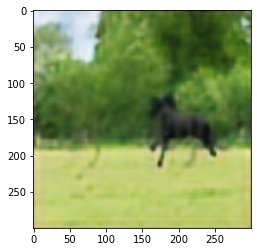

In [31]:
plt.imshow(cv2.cvtColor(result[6], cv2.COLOR_BGR2RGB))

In [32]:
watermark_auto_encoder.save('test_model')

INFO:tensorflow:Assets written to: test_model\assets


In [33]:
reconstructed_model = keras.models.load_model("test_model")


In [34]:
result = reconstructed_model.predict(X_test)

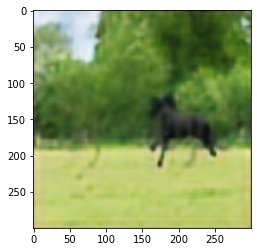

In [35]:
plt.imshow(cv2.cvtColor(result[6], cv2.COLOR_BGR2RGB))

In [36]:
type(X_test)

numpy.ndarray

In [37]:
inPath = "./IO/Input/"
inParam = "test.jpeg"
filename = inPath + inParam
image = cv2.imread(filename, cv2.IMREAD_COLOR)

In [38]:
image2 = cv2.resize(image, (width, height))
image2 = image2/255

In [39]:
X_test2 = X_test

In [40]:
X_test2 = list(X_test2)

In [41]:
X_test2.append(image2)

In [42]:
X_test2 = np.array(X_test2)

In [43]:
X_test2.shape

(403, 300, 300, 3)

In [44]:
result = reconstructed_model.predict(X_test2)

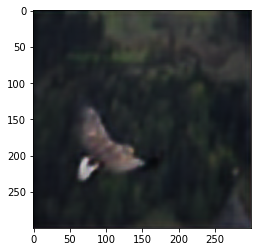

In [45]:
plt.imshow(cv2.cvtColor(result[-1], cv2.COLOR_BGR2RGB))

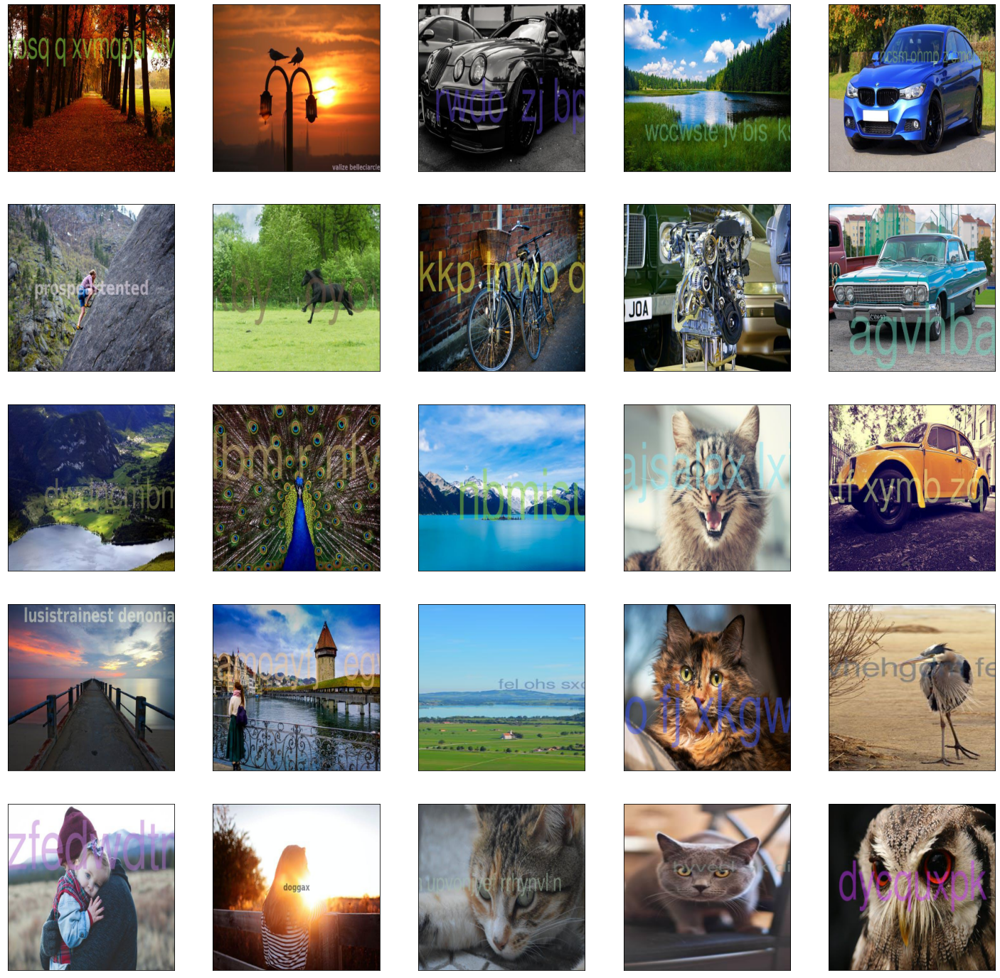

In [46]:
plt.figure(figsize=(25,25))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(cv2.cvtColor(X_test[i].astype('float32'), cv2.COLOR_BGR2RGB))
plt.show()

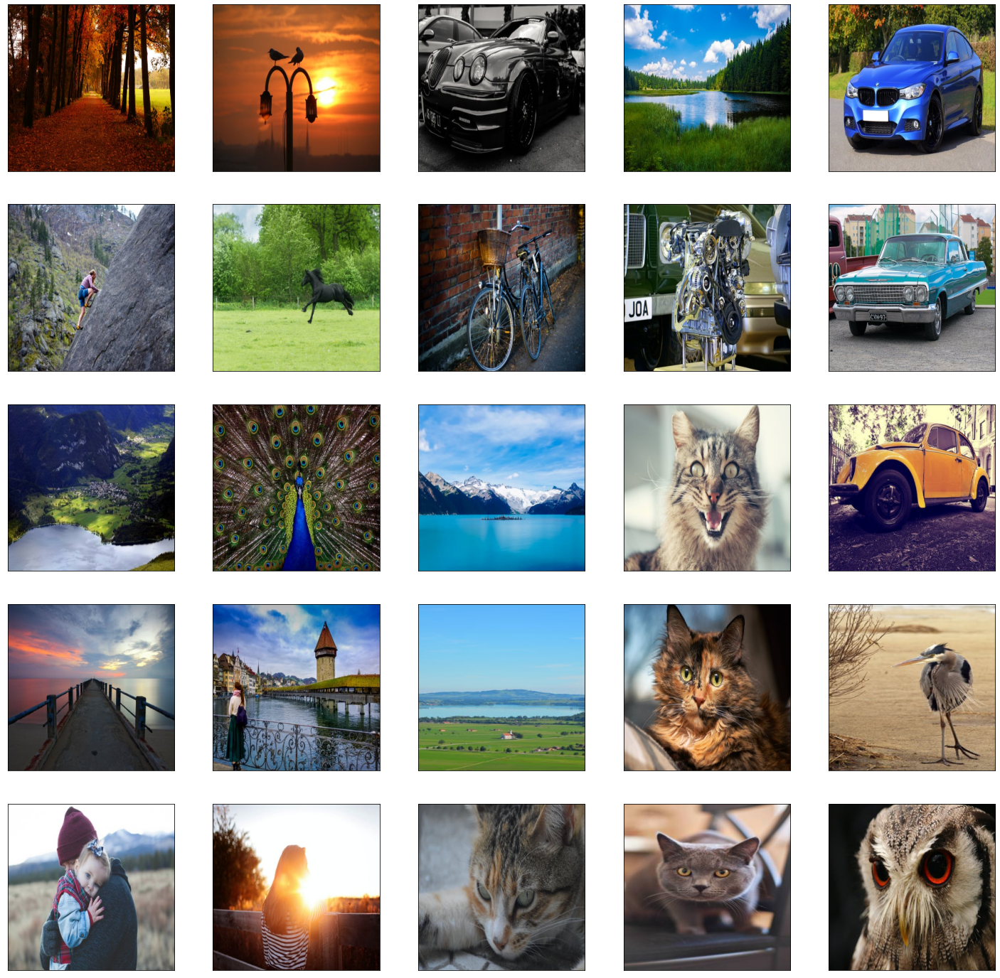

In [49]:
plt.figure(figsize=(25,25))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(cv2.cvtColor(y_test[i].astype('float32'), cv2.COLOR_BGR2RGB))
plt.show()

NameError: name 'data_augmented_X' is not defined

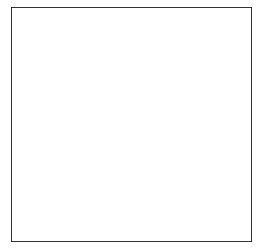

In [48]:
plt.figure(figsize=(25,25))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(cv2.cvtColor(data_augmented_X[i].astype('float32'), cv2.COLOR_BGR2RGB))
plt.show()

NameError: name 'data_augmented_y' is not defined

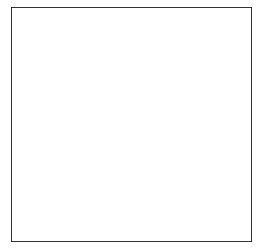

In [50]:
plt.figure(figsize=(25,25))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(cv2.cvtColor(data_augmented_y[i].astype('float32'), cv2.COLOR_BGR2RGB))
plt.show()

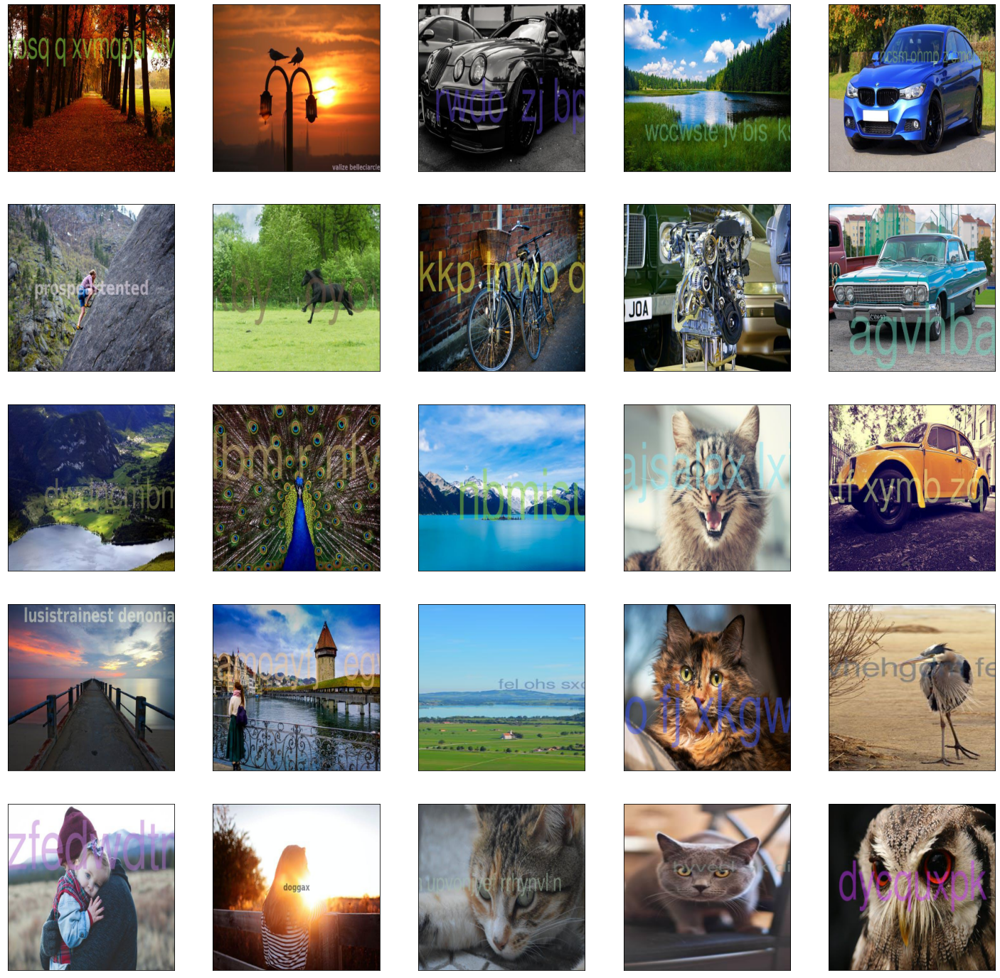

In [51]:
plt.figure(figsize=(25,25))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(cv2.cvtColor(X_test[i].astype('float32'), cv2.COLOR_BGR2RGB))
plt.show()

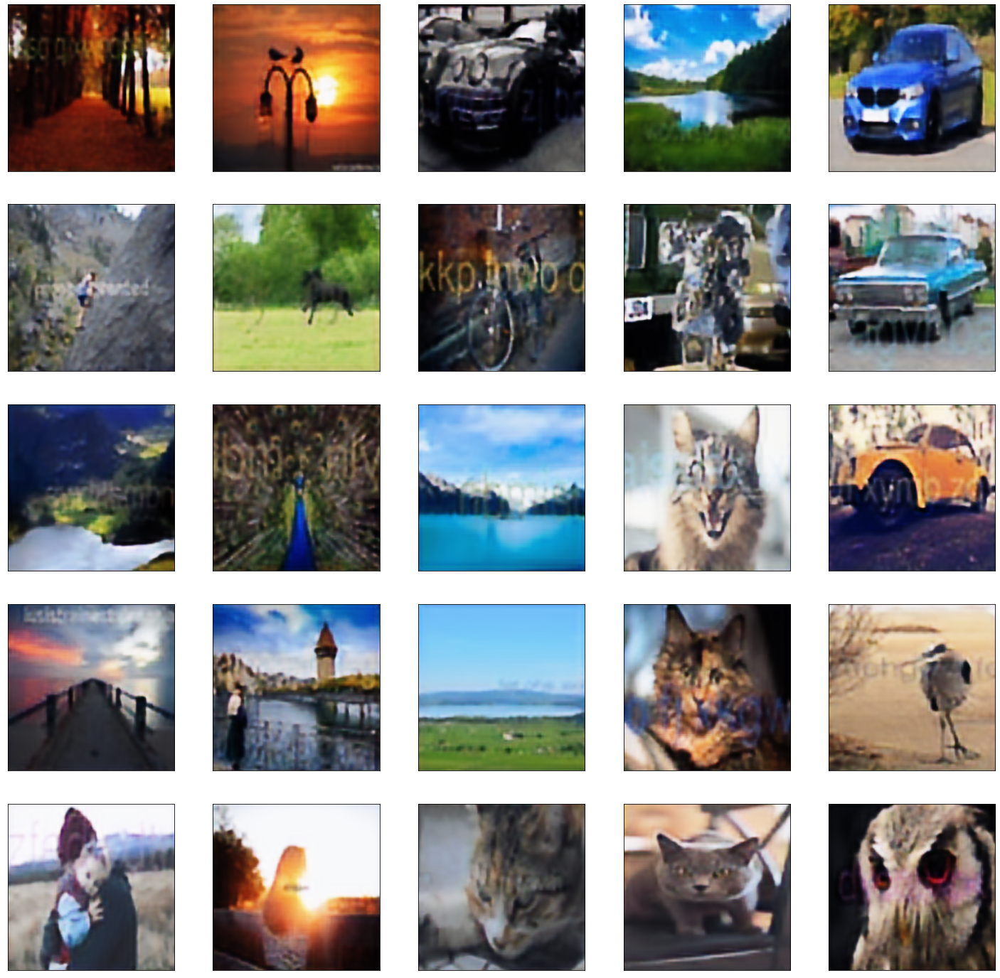

In [52]:
plt.figure(figsize=(25,25))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(cv2.cvtColor(result[i], cv2.COLOR_BGR2RGB))
plt.show()